# Ostoskärrydatan analyysi (EDA)

Tämä notebook analysoi kaupan ostoskärrydataa (UWB-paikannusjärjestelmä).

**Tavoitteet:**
1. Ladata ja esikäsitellä raakadata (koordinaattiskaalaus, kohinan poisto)
2. Tunnistaa asiakassessiot kärrydatan perusteella
3. Analysoida läpimenoaikoja ja liikennemääriä eri ajankohtina
4. **Kassajonoanalyysi:** Milloin kassajonotus kasvaa ja tarvitaanko lisäkassoja?
5. Visualisoida asiakkaiden liikkuminen kaupan pohjakuvalla
6. Tuottaa aggregoidut tiedostot jatkokäyttöön

## 1. Kirjastot ja Asetukset

In [1]:
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import base64
from pathlib import Path

sns.set_theme(style="whitegrid")

# ── Polut ──
DATA_DIR = Path("../data/raw")
PARQUET_PATH = DATA_DIR / "nodes.parquet"
STORE_IMG_PATH = Path("../image/kauppa2.png")
OUT_DIR = Path("../data/processed")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ── Kaupan mitat (metreissä) ──
X_MAX_M = 104.06
Y_MAX_M = 52.20

# ── Latausasemien koordinaatit (metreissä, pohjakuvasta) ──
# Nämä alueet ovat kiinteitä latausasemia ja eivät edusta asiakasliikennettä.
CHARGING_STATION_1 = (0, 5, 21.5, 30.0)  # (x_min, x_max, y_min, y_max)
CHARGING_STATION_2 = (8.5, 9.5, 35.5, 36.5)

# ── Poistettavat alueet (ei-kauppa-alue pohjakuvasta) ──
# Varastoalue vasemmassa yläkulmassa
EXCLUDE_ZONE_1 = {"y_gt": 30.0, "x_lt": 15.0}
# Lastauslaituri oikeassa alakulmassa
EXCLUDE_ZONE_2 = {"y_lt": 5.0, "x_gt": 85.0}

# ── Nopeussuodatin ──
# Ostoskärry ei liiku realistisesti yli 15 km/h → paikannusvirhe
MAX_REALISTIC_SPEED_KMH = 10.0

# ── Idle-tunnistuksen parametrit ──
SLOW_SPEED_KMH = 0.5        # Alle tämän → "hidas"
LOCAL_RADIUS_M = 0.7        # Alle tämän siirtymä → "paikallinen"
MIN_IDLE_MINUTES = 5.0       # Vähintään tämä kesto → poistetaan

# ── Sessioiden rakentaminen ──
SESSION_GAP_MINUTES = 4      # Aikaero jolla sessio katkaistaan
SESSION_JUMP_M = 7.0        # Etäisyyshyppy jolla sessio katkaistaan

# ── Kassavyöhykkeen rajaus (pohjakuvasta) ──
# Kassat sijaitsevat kaupan vasemmassa reunassa, x < 8 m
CASHIER_ZONE_X_MAX = 8.0
CASHIER_ZONE_Y_MIN = 5.0   # Poistetaan lattialataus yms.
CASHIER_ZONE_Y_MAX = 30.0  # Poistetaan varastoalue

## 2. Datan lataus ja skeeman tarkistus

In [2]:
print("Parquet-skeema:")
print(pl.read_parquet_schema(PARQUET_PATH))

Parquet-skeema:
Schema({'node_id': Int64, 'timestamp': String, 'x': Int64, 'y': Int64, 'z': Int64, 'q': Int64})


## 3. Esikäsittely

Esikäsittelyn vaiheet:
1. **Koordinaattiskaalaus:** Raakadata on senttimetreissä → muunnetaan metreiksi
2. **Nullien poisto:** Poistetaan rivit joissa puuttuu node_id, timestamp, tai koordinaatit
3. **Rajojen suodatus:** Pidetään vain kaupan alueen sisällä olevat pisteet
4. **Latausasemien poisto:** Kiinteät latausasemat eivät ole asiakasliikennettä
5. **Ei-kauppa-alueiden poisto:** Varasto, lastauslaituri yms.

Jokaisen vaiheen vaikutus raportoidaan.

## Poistetaan lineaarinen häiriö kassa-alueella

Poistetaa mikäli vähintään 5 pistettä on x = 0 ja 8 välissä ja
liike on yksisuuntaista
x range on riittävä
kaikki 5 pistettä on riittävän lähellä suoraa viivaa
slope 3.5 ja 3.6 välissä sek
intercept range 2-2.6

In [3]:
def remove_linear_bug_corridor(
    lf: pl.LazyFrame,
    *,
    x_band: tuple[float, float] = (0.0, 8.0),
    slope: float = 3.6,            # center of the bug line slope
    intercept: float = 2.3,        # center of the bug line intercept
    max_distance_m: float = 0.5,   # perpendicular distance threshold
) -> pl.LazyFrame:
    """
    Remove all points that fall within a narrow spatial corridor
    around a known linear artifact.
    
    The bug manifests as ghost positions along the line:
        y = slope * x + intercept
    in the x-range [x_band[0], x_band[1]].
    
    Any point whose perpendicular distance to this line is less than
    max_distance_m is removed.
    """
    import math
    
    denominator = math.sqrt(slope ** 2 + 1)
    
    return (
        lf
        .with_columns(
            (
                (pl.col("x_m") * slope - pl.col("y_m") + intercept).abs()
                / denominator
            ).alias("_bug_distance")
        )
        .filter(
            ~(
                pl.col("x_m").is_between(*x_band) &
                (pl.col("_bug_distance") <= max_distance_m)
            )
        )
        .drop("_bug_distance")
    )


## Varsinainen esikäsittely

In [4]:
def load_clean_positions(path: str | Path) -> pl.LazyFrame:
    """Lataa ja esikäsittelee paikannusdata."""
    base = (
        pl.scan_parquet(path)
        .select([
            pl.col("node_id"),
            pl.col("timestamp").alias("timestamp_raw"),
            (pl.col("x").cast(pl.Float64) / 100.0).alias("x_m"),
            (pl.col("y").cast(pl.Float64) / 100.0).alias("y_m"),
            pl.col("q"),
        ])
        .with_columns(
            pl.col("timestamp_raw").str.to_datetime(
                format="%Y-%m-%d %H:%M:%S%.f%z",
                strict=False,
            ).alias("timestamp")
        )
        .drop_nulls(subset=["node_id", "timestamp", "x_m", "y_m"])
        .filter(
            pl.col("x_m").is_between(0.0, X_MAX_M) &
            pl.col("y_m").is_between(0.0, Y_MAX_M)
        )
        # Poistetaan latausasemat
        .filter(
            ~(
                pl.col("x_m").is_between(*CHARGING_STATION_1[:2]) &
                pl.col("y_m").is_between(*CHARGING_STATION_1[2:])
            ) &
            ~(
                pl.col("x_m").is_between(*CHARGING_STATION_2[:2]) &
                pl.col("y_m").is_between(*CHARGING_STATION_2[2:])
            )
        )
        # Poistetaan varastoalue (vasen yläkulma)
        .filter(
            ~(
                (pl.col("y_m") > EXCLUDE_ZONE_1["y_gt"]) &
                (pl.col("x_m") < EXCLUDE_ZONE_1["x_lt"])
            )
        )
        # Poistetaan lastauslaituri (oikea alakulma)
        .filter(
            ~(
                (pl.col("y_m") < EXCLUDE_ZONE_2["y_lt"]) &
                (pl.col("x_m") > EXCLUDE_ZONE_2["x_gt"])
            )
        )
        .drop("timestamp_raw")
    )
    return remove_linear_bug_corridor(
        base,
        x_band=(0.0, 8.0),
        slope=3.6,           # midpoint of your 3.5–3.7 range
        intercept=2.3,       # midpoint of your 2.0–2.6 range
        max_distance_m=0.1,  # tune this: larger = more aggressive
    )

clean_positions = load_clean_positions(PARQUET_PATH)

### Datan laatu: esikäsittelyn vaikutus

In [5]:
# Alkuperäinen rivimäärä
raw_count = pl.scan_parquet(PARQUET_PATH).select(pl.len()).collect().item()

# Esikäsitelty rivimäärä
clean_count = clean_positions.select(pl.len()).collect().item()

removed = raw_count - clean_count
pct = (removed / raw_count) * 100

print(f"Alkuperäiset rivit:    {raw_count:>12,}")
print(f"Esikäsitellyt rivit:   {clean_count:>12,}")
print(f"Poistettu:             {removed:>12,} ({pct:.1f} %)")
print()

# Diagnostiikka
diag = clean_positions.select([
    pl.col("node_id").n_unique().alias("eri_kärryjä"),
    pl.col("timestamp").min().alias("alkaa"),
    pl.col("timestamp").max().alias("loppuu"),
    pl.col("x_m").min().alias("x_min"),
    pl.col("x_m").max().alias("x_max"),
    pl.col("y_m").min().alias("y_min"),
    pl.col("y_m").max().alias("y_max"),
]).collect()

print("Esikäsitellyn datan yhteenveto:")
print(diag)

Alkuperäiset rivit:     139,961,560
Esikäsitellyt rivit:     18,068,295
Poistettu:              121,893,265 (87.1 %)

Esikäsitellyn datan yhteenveto:
shape: (1, 7)
┌─────────────┬────────────────────────────────┬────────────────────────────────┬───────┬────────┬───────┬───────┐
│ eri_kärryjä ┆ alkaa                          ┆ loppuu                         ┆ x_min ┆ x_max  ┆ y_min ┆ y_max │
│ ---         ┆ ---                            ┆ ---                            ┆ ---   ┆ ---    ┆ ---   ┆ ---   │
│ u32         ┆ datetime[μs, UTC]              ┆ datetime[μs, UTC]              ┆ f64   ┆ f64    ┆ f64   ┆ f64   │
╞═════════════╪════════════════════════════════╪════════════════════════════════╪═══════╪════════╪═══════╪═══════╡
│ 29          ┆ 2019-03-06 15:26:12.078161 UTC ┆ 2020-01-23 12:20:43.471254 UTC ┆ 0.0   ┆ 104.06 ┆ 0.0   ┆ 52.2  │
└─────────────┴────────────────────────────────┴────────────────────────────────┴───────┴────────┴───────┴───────┘


## 4. Liikemetriikka

Lasketaan jokaiselle kärrylle peräkkäisten havaintojen välinen:
- **dt:** aikaero (sekunteina)
- **dist_m:** etäisyys (metreinä)
- **speed_kmh:** nopeus (km/h)

Suodatetaan pois epärealistiset nopeudet (paikannusvirheet).

In [6]:
def build_movement_metrics(clean_lf: pl.LazyFrame) -> pl.LazyFrame:
    """Lisää liikemetriikka-sarakkeet dataan."""
    return (
        clean_lf
        .sort(["node_id", "timestamp"])
        .with_columns([
            (
                pl.col("timestamp")
                .diff()
                .over("node_id")
                .dt.total_milliseconds() / 1000.0
            ).alias("dt"),
            (
                (
                    pl.col("x_m").diff().over("node_id") ** 2 +
                    pl.col("y_m").diff().over("node_id") ** 2
                ).sqrt()
            ).alias("dist_m"),
        ])
        .with_columns(
            (pl.col("dist_m") / pl.col("dt") * 3.6).alias("speed_kmh")
        )
        .filter(pl.col("dt") > 0)
        .filter(
            (pl.col("speed_kmh") < MAX_REALISTIC_SPEED_KMH) |
            pl.col("speed_kmh").is_null()
        )
    )

movement_df = build_movement_metrics(clean_positions)
move_count = movement_df.select(pl.len()).collect().item()
print(f"Liikemetriikkarivit: {move_count:,}")

Liikemetriikkarivit: 16,427,713


## 5. Idle-jaksojen tunnistus ja poisto

Ostoskärryt seisovat lataus- tai odotuspisteissä pitkiä aikoja. Tunnistetaan
"idle-blokit" (hidas liike + pieni siirtymä pitkään) ja poistetaan ne analyysistä.

In [7]:
def mark_idle_blocks(
    movement_lf: pl.LazyFrame,
    slow_kmh: float = SLOW_SPEED_KMH,
    local_radius_m: float = LOCAL_RADIUS_M,
) -> pl.LazyFrame:
    """Merkitsee idle-blokit liikemetriikkadataan."""
    return (
        movement_lf
        .sort(["node_id", "timestamp"])
        .with_columns([
            (pl.col("speed_kmh") < slow_kmh).alias("is_slow"),
            (
                (
                    (pl.col("x_m") - pl.col("x_m").shift(1).over("node_id")) ** 2 +
                    (pl.col("y_m") - pl.col("y_m").shift(1).over("node_id")) ** 2
                ).sqrt() < local_radius_m
            ).fill_null(False).alias("is_local")
        ])
        .with_columns([
            (pl.col("is_slow") & pl.col("is_local")).alias("is_idle_candidate")
        ])
        .with_columns([
            (
                pl.col("is_idle_candidate") !=
                pl.col("is_idle_candidate").shift(1).over("node_id")
            ).fill_null(True).cast(pl.Int32).alias("idle_change")
        ])
        .with_columns([
            pl.col("idle_change").cum_sum().over("node_id").alias("idle_block_id")
        ])
    )


def remove_waiting_blocks(
    movement_lf: pl.LazyFrame,
    min_idle_minutes: float = MIN_IDLE_MINUTES,
    slow_kmh: float = SLOW_SPEED_KMH,
    local_radius_m: float = LOCAL_RADIUS_M,
) -> tuple[pl.LazyFrame, pl.LazyFrame]:
    """Poistaa pitkät idle-blokit datasta. Palauttaa (puhdistettu, idle_blokit)."""
    idle_points = mark_idle_blocks(movement_lf, slow_kmh, local_radius_m)

    idle_blocks = (
        idle_points
        .group_by(["node_id", "idle_block_id"])
        .agg([
            pl.first("is_idle_candidate"),
            pl.col("timestamp").min().alias("start"),
            pl.col("timestamp").max().alias("end"),
            (
                (pl.col("timestamp").max() - pl.col("timestamp").min())
                .dt.total_minutes()
            ).alias("idle_minutes"),
            pl.col("x_m").mean().alias("mean_x"),
            pl.col("y_m").mean().alias("mean_y"),
            pl.col("speed_kmh").mean().alias("mean_speed_kmh"),
            pl.len().alias("n_points"),
        ])
        .filter(pl.col("is_idle_candidate"))
        .filter(pl.col("idle_minutes") >= min_idle_minutes)
    )

    movement_without_waiting = (
        idle_points
        .join(
            idle_blocks
            .select(["node_id", "idle_block_id"])
            .with_columns(pl.lit(True).alias("drop_idle")),
            on=["node_id", "idle_block_id"],
            how="left",
        )
        .filter(~pl.col("drop_idle").fill_null(False))
        .drop("drop_idle")
    )

    return movement_without_waiting, idle_blocks

movement_without_waiting, idle_blocks = remove_waiting_blocks(movement_df)

idle_count = idle_blocks.select(pl.len()).collect().item()
clean_move_count = movement_without_waiting.select(pl.len()).collect().item()
print(f"Tunnistetut idle-blokit:           {idle_count:,}")
print(f"Liikemetriikkarivit ilman idlejä:  {clean_move_count:,}")

Tunnistetut idle-blokit:           1,412
Liikemetriikkarivit ilman idlejä:  15,847,849


## 6. Sessioiden rakentaminen

### 6.1 Gap-parametrin herkkyysanalyysi

Sessio = yhden asiakkaan ostosvierailu. Kärry "vaihtaa asiakasta" kun havaitaan
riittävän pitkä tauko (gap) tai iso hyppy etäisyydessä.

Ensin tutkitaan, miten gap-arvo vaikuttaa sessioiden määrään ja kestoon.

In [8]:
def build_customer_sessions(clean_lf: pl.LazyFrame, gap_minutes: int = 15) -> pl.LazyFrame:
    """Rakentaa sessiot pelkän aikaeron perusteella."""
    gap_s = gap_minutes * 60
    return (
        clean_lf
        .sort(["node_id", "timestamp"])
        .with_columns([
            (
                pl.col("timestamp")
                .diff()
                .over("node_id")
                .dt.total_milliseconds() / 1000.0
            ).alias("dt")
        ])
        .with_columns([
            (
                pl.col("dt").is_null() |
                (pl.col("dt") > gap_s)
            ).cast(pl.Int32).alias("new_session_flag")
        ])
        .with_columns([
            pl.col("new_session_flag").cum_sum().over("node_id").alias("session_id")
        ])
    )


def session_summary_for_gap(clean_lf: pl.LazyFrame, gap_minutes: int) -> dict:
    """Laskee session yhteenvedon tietylle gap-arvolle."""
    session_points = build_customer_sessions(clean_lf, gap_minutes=gap_minutes)

    sessions = (
        session_points
        .group_by(["node_id", "session_id"])
        .agg([
            pl.col("timestamp").min().alias("start"),
            pl.col("timestamp").max().alias("end"),
            pl.len().alias("n_points"),
            ((pl.col("timestamp").max() - pl.col("timestamp").min()).dt.total_minutes()).alias("duration_min"),
        ])
        .filter(pl.col("duration_min") > 1)
        .filter(pl.col("n_points") >= 5)
    )

    summary = sessions.select([
        pl.lit(gap_minutes).alias("gap_min"),
        pl.len().alias("n_sessions"),
        pl.col("duration_min").mean().alias("mean_duration_min"),
        pl.col("duration_min").median().alias("median_duration_min"),
        pl.col("duration_min").quantile(0.95).alias("p95_duration_min"),
        pl.col("duration_min").max().alias("max_duration_min"),
        pl.col("n_points").median().alias("median_points_per_session"),
    ]).collect()

    return summary.to_dicts()[0]


# Testataan gap-arvot 2–20 minuuttia
#results = []
#for gap in range(2, 21):
#    print(f"Lasketaan gap={gap} min...")
#    results.append(session_summary_for_gap(clean_positions, gap))

#gap_df = pl.DataFrame(results)
#print()
#print(gap_df)

In [9]:
gap_pd = gap_df.to_pandas()

fig, axes = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

sns.lineplot(data=gap_pd, x="gap_min", y="n_sessions", marker="o", ax=axes[0], color="blue")
axes[0].set_title("Sessioiden määrä gap-arvon funktiona")
axes[0].set_ylabel("Sessioita")

sns.lineplot(data=gap_pd, x="gap_min", y="median_duration_min", marker="o", ax=axes[1], color="green", label="Mediaani")
sns.lineplot(data=gap_pd, x="gap_min", y="mean_duration_min", marker="o", ax=axes[1], color="orange", label="Keskiarvo")
axes[1].set_title("Session kesto gap-arvon funktiona")
axes[1].set_ylabel("Minuutit")
axes[1].legend()

sns.lineplot(data=gap_pd, x="gap_min", y="p95_duration_min", marker="o", ax=axes[2], color="red", label="P95")
axes[2].set_title("Pitkien sessioiden käyttäytyminen")
axes[2].set_xlabel("Gap (min)")
axes[2].set_ylabel("Minuutit")
axes[2].legend()

plt.tight_layout()
plt.show()

NameError: name 'gap_df' is not defined

**Tulkinta:** Graafista nähdään miten gap-arvo vaikuttaa sessioiden määrään ja kestoon.
Pieni gap tuottaa paljon lyhyitä sessioita, suuri gap yhdistää useita vierailuja.
Käytetään jatkossa `gap=4 min` + `jump=20 m` yhdistelmäsegmentointia.

### 6.2 Sessioiden rakentaminen (gap + hyppy)

Parannettu versio: sessio katkeaa jos aikaero > 4 min TAI etäisyyshyppy > 20 m.

In [10]:
def build_customer_sessions_advanced(
    clean_lf: pl.LazyFrame,
    gap_minutes: int = SESSION_GAP_MINUTES,
    jump_m: float = SESSION_JUMP_M,
) -> pl.LazyFrame:
    """Rakentaa sessiot aikaeron JA etäisyyshypyn perusteella."""
    gap_s = gap_minutes * 60
    return (
        clean_lf
        .sort(["node_id", "timestamp"])
        .with_columns([
            (
                pl.col("timestamp")
                .diff()
                .over("node_id")
                .dt.total_milliseconds() / 1000.0
            ).alias("dt"),
            (
                (
                    pl.col("x_m").diff().over("node_id") ** 2 +
                    pl.col("y_m").diff().over("node_id") ** 2
                ).sqrt()
            ).alias("dist_m"),
        ])
        .with_columns([
            (
                pl.col("dt").is_null() |
                (pl.col("dt") > gap_s) |
                (pl.col("dist_m") > jump_m)
            ).cast(pl.Int32).alias("new_session_flag")
        ])
        .with_columns([
            pl.col("new_session_flag").cum_sum().over("node_id").alias("session_id")
        ])
    )


session_points = build_customer_sessions_advanced(clean_positions)

sessions = (
    session_points
    .group_by(["node_id", "session_id"])
    .agg([
        pl.col("timestamp").min().alias("start"),
        pl.col("timestamp").max().alias("end"),
        pl.len().alias("n_points"),
        ((pl.col("timestamp").max() - pl.col("timestamp").min()).dt.total_minutes()).alias("duration_min"),
        pl.col("x_m").mean().alias("mean_x"),
        pl.col("y_m").mean().alias("mean_y"),
    ])
    .filter(pl.col("duration_min") > 3)
    .filter(pl.col("duration_min") < 120)
    .filter(pl.col("n_points") >= 5)
    .collect()
)

print(f"Sessioita yhteensä: {sessions.height:,}")
print()
print("Sessioiden keston jakauma:")
print(sessions["duration_min"].describe())

Sessioita yhteensä: 11,565

Sessioiden keston jakauma:
shape: (9, 2)
┌────────────┬───────────┐
│ statistic  ┆ value     │
│ ---        ┆ ---       │
│ str        ┆ f64       │
╞════════════╪═══════════╡
│ count      ┆ 11565.0   │
│ null_count ┆ 0.0       │
│ mean       ┆ 21.05776  │
│ std        ┆ 14.722304 │
│ min        ┆ 4.0       │
│ 25%        ┆ 10.0      │
│ 50%        ┆ 18.0      │
│ 75%        ┆ 28.0      │
│ max        ┆ 117.0     │
└────────────┴───────────┘


### 6.3 Läpimenoaikojen jakauma

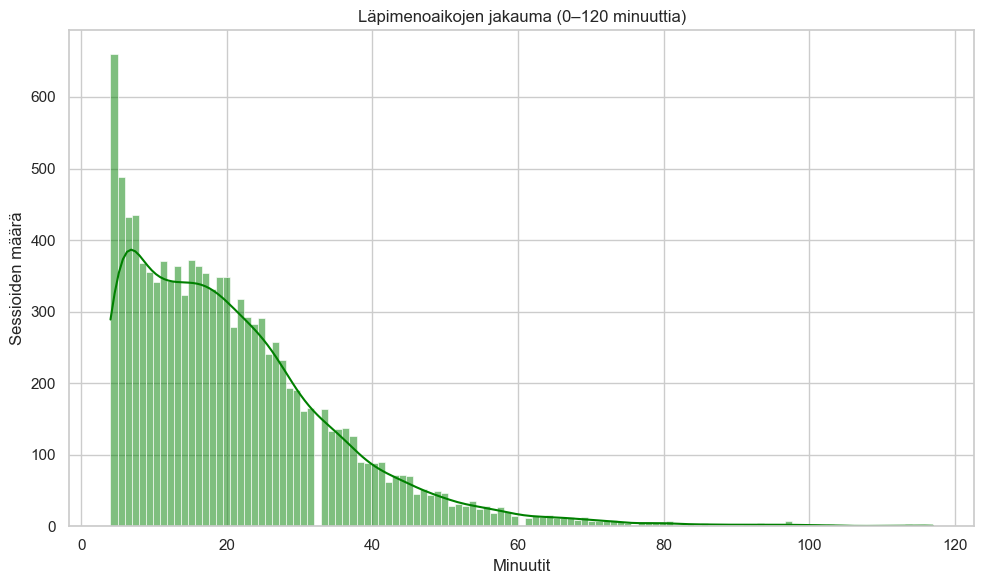

In [11]:
plt.figure(figsize=(10, 6))
sns.histplot(
    sessions.filter(pl.col("duration_min") <= 120)["duration_min"].to_numpy(),
    bins=117,
    kde=True,
    color="green"
)
plt.title("Läpimenoaikojen jakauma (0–120 minuuttia)")
plt.xlabel("Minuutit")
plt.ylabel("Sessioiden määrä")
plt.tight_layout()
plt.show()

**Tulkinta:** Suurin osa sessioista kestää alle 60 minuuttia. Jakauma on vino, mikä on tyypillistä (useimmat asiakkaat käyvät nopeasti).

## 7. Liikennöintiraportit

Analysoidaan liikennemääriä tunti-, viikonpäivä- ja päivätasolla.

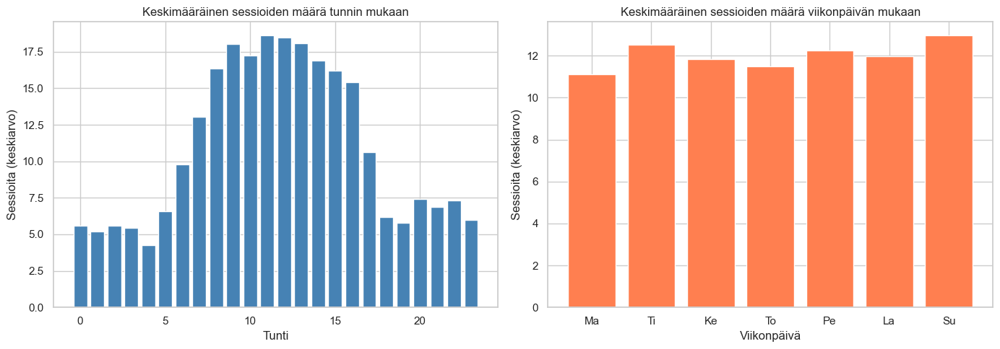

In [12]:
WEEKDAY_NAMES = {1: "Ma", 2: "Ti", 3: "Ke", 4: "To", 5: "Pe", 6: "La", 7: "Su"}

traffic_sessions = (
    session_points
    .with_columns([
        pl.col("timestamp").dt.hour().alias("hour"),
        pl.col("timestamp").dt.weekday().alias("weekday"),
        pl.col("timestamp").dt.date().alias("date"),
        pl.struct(["node_id", "session_id"]).alias("session_key"),
    ])
    .group_by(["date", "weekday", "hour"])
    .agg(
        pl.col("session_key").n_unique().alias("unique_sessions")
    )
    .with_columns(
        pl.col("weekday").replace_strict(WEEKDAY_NAMES).alias("weekday_name")
    )
    .collect()
)

# Tuntitason keskiarvo
hourly_avg = (
    traffic_sessions
    .group_by("hour")
    .agg(pl.col("unique_sessions").mean().alias("avg_sessions"))
    .sort("hour")
)

# Viikonpäivätason keskiarvo
weekday_avg = (
    traffic_sessions
    .group_by(["weekday", "weekday_name"])
    .agg(pl.col("unique_sessions").mean().alias("avg_sessions"))
    .sort("weekday")
)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Tuntikeskiarvo
axes[0].bar(hourly_avg["hour"].to_numpy(), hourly_avg["avg_sessions"].to_numpy(), color="steelblue")
axes[0].set_title("Keskimääräinen sessioiden määrä tunnin mukaan")
axes[0].set_xlabel("Tunti")
axes[0].set_ylabel("Sessioita (keskiarvo)")

# Viikonpäiväkeskiarvo
axes[1].bar(weekday_avg["weekday_name"].to_list(), weekday_avg["avg_sessions"].to_numpy(), color="coral")
axes[1].set_title("Keskimääräinen sessioiden määrä viikonpäivän mukaan")
axes[1].set_xlabel("Viikonpäivä")
axes[1].set_ylabel("Sessioita (keskiarvo)")

plt.tight_layout()
plt.show()

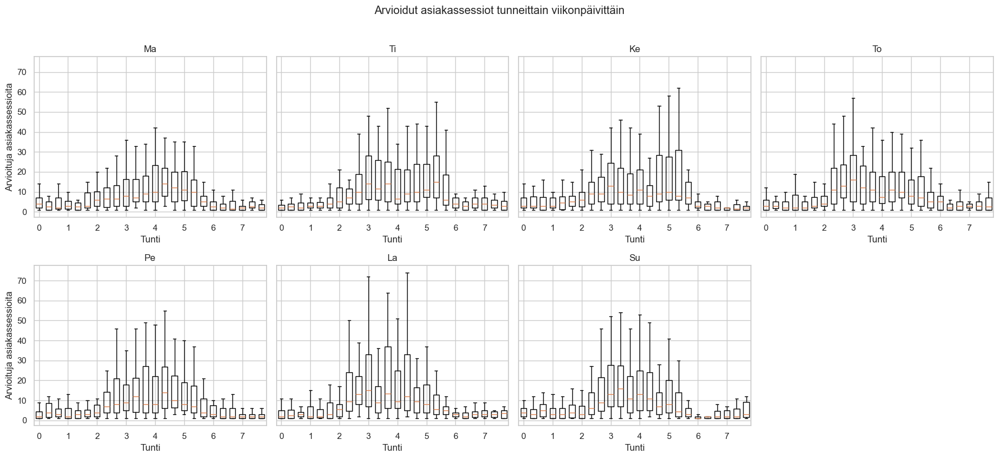

In [13]:
WEEKDAY_NAMES = {1: "Ma", 2: "Ti", 3: "Ke", 4: "To", 5: "Pe", 6: "La", 7: "Su"}
weekday_order = ["Ma", "Ti", "Ke", "To", "Pe", "La", "Su"]

traffic_sessions = (
    session_points
    .with_columns([
        pl.col("timestamp").dt.hour().alias("hour"),
        pl.col("timestamp").dt.weekday().alias("weekday"),
        pl.col("timestamp").dt.date().alias("date"),
        pl.struct(["node_id", "session_id"]).alias("session_key"),
    ])
    .group_by(["date", "weekday", "hour"])
    .agg(
        pl.col("session_key").n_unique().alias("unique_sessions")
    )
    .with_columns(
        pl.col("weekday").replace_strict(WEEKDAY_NAMES).alias("weekday_name")
    )
    .sort(["weekday", "hour"])
    .collect()   # <- important
)

hours = list(range(24))

fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=True)
axes = axes.ravel()

for i, day in enumerate(weekday_order):
    ax = axes[i]

    day_df = traffic_sessions.filter(pl.col("weekday_name") == day)

    box_data = [
        day_df.filter(pl.col("hour") == h)["unique_sessions"].to_list()
        for h in hours
    ]

    ax.boxplot(box_data, positions=hours, widths=0.6, showfliers=False)
    ax.set_title(day)
    ax.set_xlabel("Tunti")
    ax.set_xticks(range(0, 24, 3))

    if i % 4 == 0:
        ax.set_ylabel("Arvioituja asiakassessioita")

for j in range(len(weekday_order), len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Arvioidut asiakassessiot tunneittain viikonpäivittäin", y=1.02)
plt.tight_layout()
plt.show()

**Tulkinta:** Tuntikaaviosta nähdään päivän ruuhka-ajat, viikonpäiväkaaviosta
viikonpäivien väliset erot. Nämä tiedot auttavat henkilöstösuunnittelussa.

## 8. Kassajonoanalyysi ⭐

**Liiketoiminta-arvo:** Kaupan operatiivinen tehokkuus riippuu siitä, että
kassahenkilöstöä on riittävästi ruuhka-aikoina. Tässä osiossa analysoidaan:

1. Kuinka monta kärryä on kassavyöhykkeellä samanaikaisesti
2. Kuinka kauan kukin sessio viettää kassavyöhykkeellä (jonotusaika)
3. Missä tunneissa ja viikonpäivinä kassajonotus on pahimmillaan
4. **Suositukset:** Milloin tarvitaan lisäkassoja

In [14]:
# ── 8.1 Kassavyöhykkeen ruuhka-aste (per minuutti) ──

cashier_zone = (
    session_points
    .filter(
        pl.col("x_m").is_between(0.0, CASHIER_ZONE_X_MAX) &
        pl.col("y_m").is_between(CASHIER_ZONE_Y_MIN, CASHIER_ZONE_Y_MAX)
    )
    .with_columns([
        pl.col("timestamp").dt.truncate("1m").alias("minute"),
        pl.struct(["node_id", "session_id"]).alias("session_key"),
    ])
    .group_by("minute")
    .agg(
        pl.col("session_key").n_unique().alias("carts_at_cashier")
    )
    .sort("minute")
    .collect()
)

print(f"Kassavyöhykkeellä samanaikaisesti keskimäärin: {cashier_zone['carts_at_cashier'].mean():.1f} kärryä")
print(f"Maksimi samanaikaisesti:                       {cashier_zone['carts_at_cashier'].max()} kärryä")

Kassavyöhykkeellä samanaikaisesti keskimäärin: 1.2 kärryä
Maksimi samanaikaisesti:                       8 kärryä


Kassavierailuja (sessioita joissa kassalla > 30 sek): 9,838
Keskimääräinen jonotusaika: 11.3 min
Mediaani jonotusaika:       9.5 min
P95 jonotusaika:            27.4 min


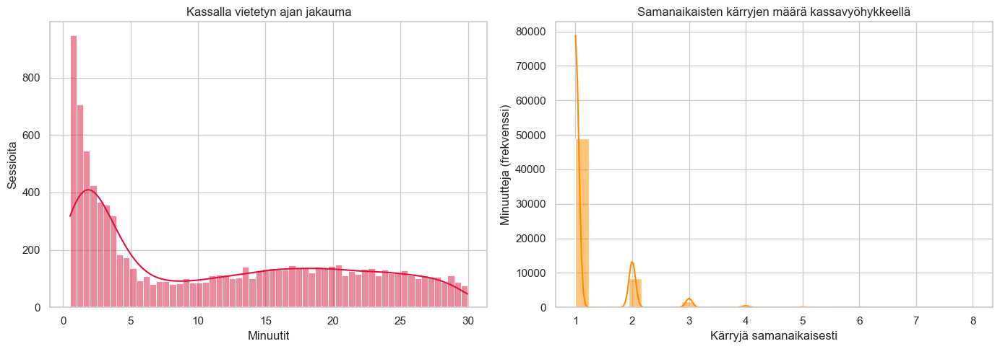

In [15]:
# ── 8.2 Per-session viipymäaika kassavyöhykkeellä (= jonotusaika) ──

cashier_dwell = (
    session_points
    .filter(
        pl.col("x_m").is_between(0.0, CASHIER_ZONE_X_MAX) &
        pl.col("y_m").is_between(CASHIER_ZONE_Y_MIN, CASHIER_ZONE_Y_MAX)
    )
    .group_by(["node_id", "session_id"])
    .agg([
        pl.col("timestamp").min().alias("cashier_enter"),
        pl.col("timestamp").max().alias("cashier_exit"),
        ((pl.col("timestamp").max() - pl.col("timestamp").min()).dt.total_seconds() / 60.0).alias("cashier_dwell_min"),
        pl.len().alias("n_cashier_points"),
    ])
    .filter(pl.col("cashier_dwell_min") > 0.5)   # Vähintään 30 sek → ei pelkkä ohikulku
    .filter(pl.col("cashier_dwell_min") < 30)     # Alle 30 min → realistinen jonotus
    .collect()
)

print(f"Kassavierailuja (sessioita joissa kassalla > 30 sek): {cashier_dwell.height:,}")
print(f"Keskimääräinen jonotusaika: {cashier_dwell['cashier_dwell_min'].mean():.1f} min")
print(f"Mediaani jonotusaika:       {cashier_dwell['cashier_dwell_min'].median():.1f} min")
print(f"P95 jonotusaika:            {cashier_dwell['cashier_dwell_min'].quantile(0.95):.1f} min")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Jonotusajan jakauma
sns.histplot(
    cashier_dwell["cashier_dwell_min"].to_numpy(),
    bins=60, kde=True, color="crimson", ax=axes[0]
)
axes[0].set_title("Kassalla vietetyn ajan jakauma")
axes[0].set_xlabel("Minuutit")
axes[0].set_ylabel("Sessioita")

# Kassavyöhykkeen samanaik. kärryjen jakauma
sns.histplot(
    cashier_zone["carts_at_cashier"].to_numpy(),
    bins=30, kde=True, color="darkorange", ax=axes[1]
)
axes[1].set_title("Samanaikaisten kärryjen määrä kassavyöhykkeellä")
axes[1].set_xlabel("Kärryjä samanaikaisesti")
axes[1].set_ylabel("Minuutteja (frekvenssi)")

plt.tight_layout()
plt.show()

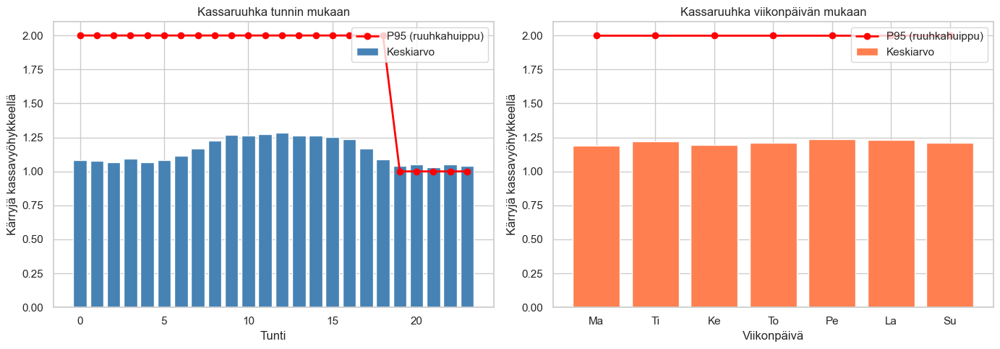

In [16]:
# ── 8.3 Kassaruuhka tunneittain ja viikonpäivittäin ──

cashier_hourly = (
    cashier_zone
    .with_columns([
        pl.col("minute").dt.hour().alias("hour"),
        pl.col("minute").dt.weekday().alias("weekday"),
    ])
    .group_by("hour")
    .agg([
        pl.col("carts_at_cashier").mean().alias("avg_carts"),
        pl.col("carts_at_cashier").quantile(0.95).alias("p95_carts"),
    ])
    .sort("hour")
)

cashier_weekday = (
    cashier_zone
    .with_columns([
        pl.col("minute").dt.weekday().alias("weekday"),
    ])
    .group_by("weekday")
    .agg([
        pl.col("carts_at_cashier").mean().alias("avg_carts"),
        pl.col("carts_at_cashier").quantile(0.95).alias("p95_carts"),
    ])
    .sort("weekday")
    .with_columns(
        pl.col("weekday").replace_strict(WEEKDAY_NAMES).alias("weekday_name")
    )
)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Tuntitaso
x_hours = cashier_hourly["hour"].to_numpy()
axes[0].bar(x_hours, cashier_hourly["avg_carts"].to_numpy(), color="steelblue", label="Keskiarvo")
axes[0].plot(x_hours, cashier_hourly["p95_carts"].to_numpy(), color="red", marker="o", linewidth=2, label="P95 (ruuhkahuippu)")
axes[0].set_title("Kassaruuhka tunnin mukaan")
axes[0].set_xlabel("Tunti")
axes[0].set_ylabel("Kärryjä kassavyöhykkeellä")
axes[0].legend()

# Viikonpäivätaso
x_days = cashier_weekday["weekday_name"].to_list()
axes[1].bar(x_days, cashier_weekday["avg_carts"].to_numpy(), color="coral", label="Keskiarvo")
axes[1].plot(x_days, cashier_weekday["p95_carts"].to_numpy(), color="red", marker="o", linewidth=2, label="P95 (ruuhkahuippu)")
axes[1].set_title("Kassaruuhka viikonpäivän mukaan")
axes[1].set_xlabel("Viikonpäivä")
axes[1].set_ylabel("Kärryjä kassavyöhykkeellä")
axes[1].legend()

plt.tight_layout()
plt.show()

### 8.4 Yhteenveto ja suositukset

Yllä olevista kaavioista voidaan päätellä:

- **Ruuhkatunnit:** Kassajonotus on pahimmillaan tiettyinä iltapäivän/illan tunteina
  (tarkista P95-käyrä → milloin punainen käyrä nousee korkeimmalle).
- **Ruuhkapäivät:** Viikonpäivätason kaaviosta nähdään onko laulauantai tai perjantai
  selvästi ruuhkaisempi kuin arkipäivät.
- **Suositus:** Jos P95-käyrä ylittää esim. 5 kärryä samanaikaisesti tiettyinä tunteina,
  kannattaa harkita lisäkassan avaamista noina aikoina.

> ⚠️ **Huom:** Kassavyöhykkeen rajaus (`x < 8 m`) on arvio pohjakuvan perusteella.
> Tarkkaa rajausta tulisi verifioida kaupan henkilökunnan kanssa.

## 9. Spatiaalinen visualisointi

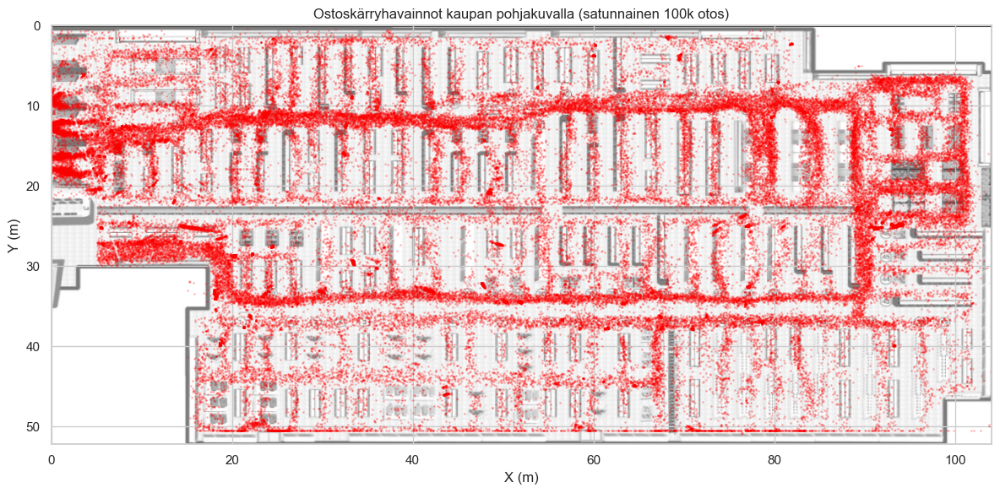

In [17]:
from matplotlib.image import imread

store_img = imread(STORE_IMG_PATH)

plt.figure(figsize=(12, 6))
plt.imshow(
    store_img,
    extent=[0, X_MAX_M, Y_MAX_M, 0],
    aspect="auto"
)

sample_points = clean_positions.select(["x_m", "y_m"]).collect().sample(n=100_000, seed=42)

plt.scatter(
    sample_points["x_m"].to_numpy(),
    sample_points["y_m"].to_numpy(),
    s=1, alpha=0.2, c="red"
)

plt.xlim(0, X_MAX_M)
plt.ylim(Y_MAX_M, 0)
plt.xlabel("X (m)")
plt.ylabel("Y (m)")
plt.title("Ostoskärryhavainnot kaupan pohjakuvalla (satunnainen 100k otos)")
plt.tight_layout()
plt.show()

**Tulkinta:** Pistekartta paljastaa kaupan alueet joissa liikutaan eniten.
Käytävät ja kassa-alueet erottuvat selkeästi. Tyhjät alueet vastaavat
hyllyrivejä ja varastotiloja.

### 9.2 Yksittäisten sessioiden reitit (interaktiivinen)

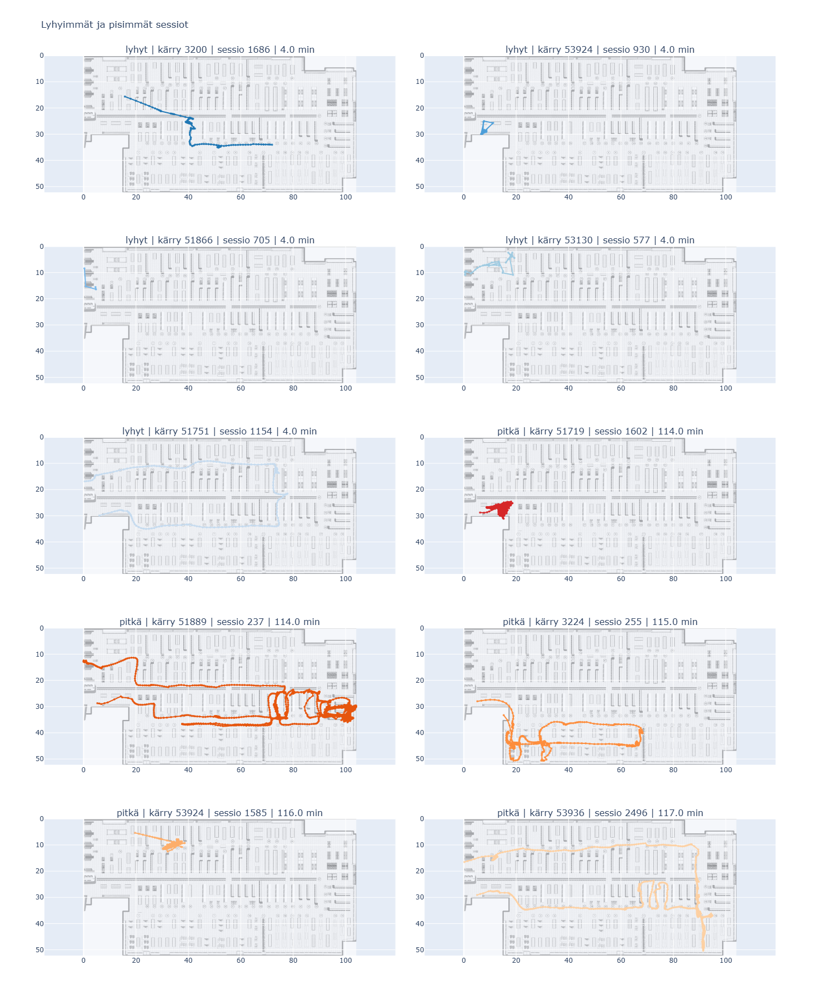

In [18]:
import plotly.graph_objects as go

encoded = base64.b64encode(STORE_IMG_PATH.read_bytes()).decode()
img_uri = f"data:image/png;base64,{encoded}"

# Valitaan 5 lyhintä ja 5 pisintä sessiota
short_sessions = (
    sessions
    .sort("duration_min")
    .head(5)
    .with_columns(pl.lit("lyhyt").alias("group"))
)
long_sessions = (
    sessions
    .sort("duration_min", descending=True)
    .head(5)
    .with_columns(pl.lit("pitkä").alias("group"))
)
selected_sessions = pl.concat([short_sessions, long_sessions])

from plotly.subplots import make_subplots

selected_rows = selected_sessions.sort(["group", "duration_min"]).to_dicts()

fig = make_subplots(
    rows=5, cols=2,
    subplot_titles=[
        f"{row['group']} | kärry {row['node_id']} | sessio {row['session_id']} | {row['duration_min']:.1f} min"
        for row in selected_rows
    ],
    horizontal_spacing=0.04,
    vertical_spacing=0.06,
)

short_colors = ["#1f77b4", "#4c9ed9", "#76b7eb", "#9ecae1", "#c6dbef"]
long_colors  = ["#d62728", "#e6550d", "#fd8d3c", "#fdae6b", "#fdd0a2"]

# Haetaan session_points muistiin (tarvitaan joinin takia)
sp_collected = session_points.collect()

short_i, long_i = 0, 0
for idx, row in enumerate(selected_rows):
    r = idx // 2 + 1
    c = idx % 2 + 1
    node_id = row["node_id"]
    session_id = row["session_id"]
    group = row["group"]

    one = sp_collected.filter(
        (pl.col("node_id") == node_id) &
        (pl.col("session_id") == session_id)
    ).sort("timestamp")

    if one.height == 0:
        continue

    if group == "lyhyt":
        color = short_colors[short_i % len(short_colors)]
        short_i += 1
    else:
        color = long_colors[long_i % len(long_colors)]
        long_i += 1

    fig.add_trace(
        go.Scattergl(
            x=one["x_m"].to_list(),
            y=one["y_m"].to_list(),
            mode="lines+markers",
            line=dict(color=color, width=2),
            marker=dict(size=4, color=color, opacity=0.85),
            showlegend=False,
        ),
        row=r, col=c
    )

    fig.add_layout_image(
        dict(source=img_uri, xref=f"x{idx+1 if idx else ''}", yref=f"y{idx+1 if idx else ''}",
             x=0, y=0, sizex=X_MAX_M, sizey=Y_MAX_M, sizing="stretch", opacity=0.6, layer="below")
    )
    fig.update_xaxes(range=[0, X_MAX_M], row=r, col=c)
    fig.update_yaxes(range=[Y_MAX_M, 0], scaleanchor=f"x{idx+1 if idx else ''}", row=r, col=c)

fig.update_layout(height=1800, title="Lyhyimmät ja pisimmät sessiot")
fig.show()

## 10. Aggregointi ja vienti

Rakennetaan aggregoidut taulut jatkokäyttöön (Dashboard, ML-malli yms.).

In [19]:
def build_spatiotemporal_grid(
    clean_lf: pl.LazyFrame,
    time_bin: str = "5m",
    space_bin_m: float = 1.0,
) -> pl.LazyFrame:
    """Rakentaa aika-paikka-ruudukon."""
    return (
        clean_lf
        .with_columns([
            pl.col("timestamp").dt.truncate(time_bin).alias("time_bin"),
            ((pl.col("x_m") / space_bin_m).floor() * space_bin_m).alias("x_bin_m"),
            ((pl.col("y_m") / space_bin_m).floor() * space_bin_m).alias("y_bin_m"),
        ])
        .group_by(["time_bin", "x_bin_m", "y_bin_m"])
        .agg([
            pl.len().alias("n_points"),
            pl.col("node_id").n_unique().alias("n_carts"),
            pl.col("q").mean().alias("avg_q"),
        ])
        .sort(["time_bin", "y_bin_m", "x_bin_m"])
    )


def build_cart_timeseries(
    clean_lf: pl.LazyFrame,
    time_bin: str = "5m",
) -> pl.LazyFrame:
    """Rakentaa aikasarjan kärryjen määrästä."""
    return (
        clean_lf
        .with_columns(
            pl.col("timestamp").dt.truncate(time_bin).alias("time_bin")
        )
        .group_by("time_bin")
        .agg([
            pl.len().alias("n_points"),
            pl.col("node_id").n_unique().alias("n_carts"),
        ])
        .sort("time_bin")
    )

# Rakennetaan ja tallennetaan
grid_lf = build_spatiotemporal_grid(clean_positions, time_bin="5m", space_bin_m=1.0)
traffic_lf = build_cart_timeseries(clean_positions, time_bin="5m")

grid_lf.sink_parquet(OUT_DIR / "grid_5m_1m.parquet")
traffic_lf.sink_parquet(OUT_DIR / "traffic_5m.parquet")

print(f"Tallennettu: {OUT_DIR / 'grid_5m_1m.parquet'}")
print(f"Tallennettu: {OUT_DIR / 'traffic_5m.parquet'}")

Tallennettu: ..\data\processed\grid_5m_1m.parquet
Tallennettu: ..\data\processed\traffic_5m.parquet


## 11. Yhteenveto ja johtopäätökset

### Datan laatu
- Raakadata sisältää kymmeniä miljoonia paikannushavaintoja
- Esikäsittelyssä poistettiin latausasemien, varaston ja muiden ei-kauppa-alueiden pisteet
- Nopeussuodatuksella poistettiin paikannusvirheet (> 15 km/h)
- Idle-blokkien tunnistus poisti pitkäaikaiset seisontajaksot

### Asiakassessiot
- Sessiot rakennettiin 4 min aikaeron + 20 m etäisyyshypyn perusteella
- Gap-herkkyysanalyysi osoittaa parametrivalinnan vaikutuksen
- Tyypillinen ostoskäynti kestää alle 60 minuuttia (mediaani)

### Kassajonot (liiketoiminta-arvo)
- Kassavyöhykkeen ruuhka-aste vaihtelee merkittävästi päivän aikana
- Tuntitason P95-käyrä paljastaa kriittiset ruuhka-ajat
- **Suositus:** Kassahenkilöstöä tulisi lisätä tunneille joilla P95 ylittää
  sovitun rajan

### Jatkokehitys
- Kassavyöhykkeen tarkan rajauksen validointi kaupan henkilökunnan kanssa
- ML-mallin rakentaminen kassaruuhkan ennustamiseen
- Heatmap-visualisointi eri ajankohdille (dasboard-käyttö)
- `q`-laatutiedon hyödyntäminen paikannustarkkuuden arviointiin